# Q1: 2-1: Analysis of Dataset

In [1]:
import os
import matplotlib.pyplot as plt

text_files= {
    "train": "camvid_train.txt",
    "test": "camvid_test.txt",
    "val" : "camvid_val.txt",
    "trainval": "camvid_trainval.txt"
}
label_folder = "CamVid_Label"

dataset_info = {} # this variable is used to save phots info

for data_type_name, text_file_name in text_files.items():
    text_file_path = os.path.join("CamVid",text_file_name)
    with open(text_file_path, 'r') as f:
        lines = f.readlines()
    rgb_photo_paths, label_photo_paths = [] , []
    # reading data paths for rgb and labled photos
    for line in lines:
        rgb_photo_path, _ = line.strip().split()
        rgb_photo_path = os.path.join("CamVid", rgb_photo_path)
        label_photo_path = os.path.basename(rgb_photo_path).replace('.png', '_L.png')
        label_photo_path= os.path.join("CamVid",label_folder, label_photo_path)

        rgb_photo_paths.append(rgb_photo_path)
        label_photo_paths.append(label_photo_path)

    dataset_info[data_type_name] = (rgb_photo_paths , label_photo_paths)
    
    print(f"the number of {data_type_name} photos is: {len(dataset_info[data_type_name][0])}")


the number of train photos is: 367
the number of test photos is: 233
the number of val photos is: 101
the number of trainval photos is: 468


# Q1: 2-1: Showing some samples from dataset:

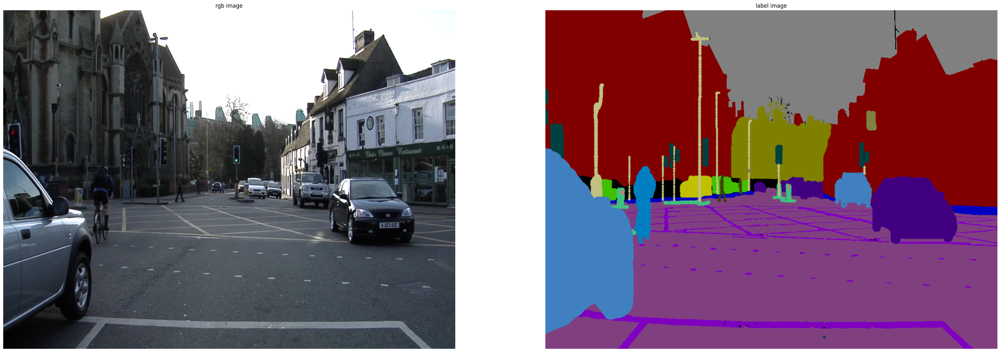

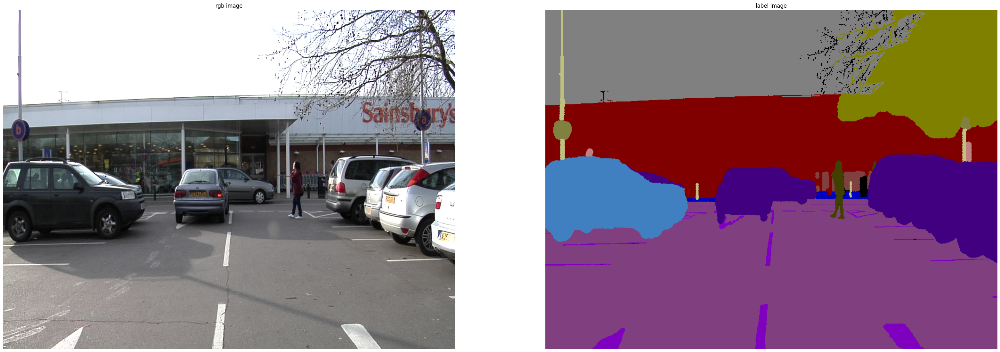

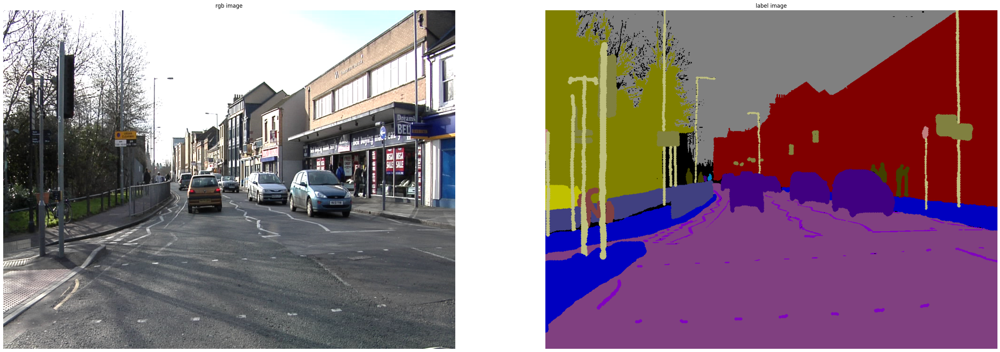

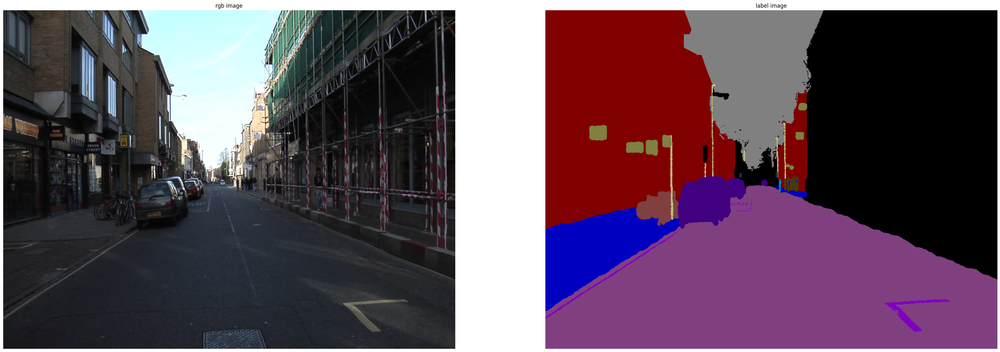

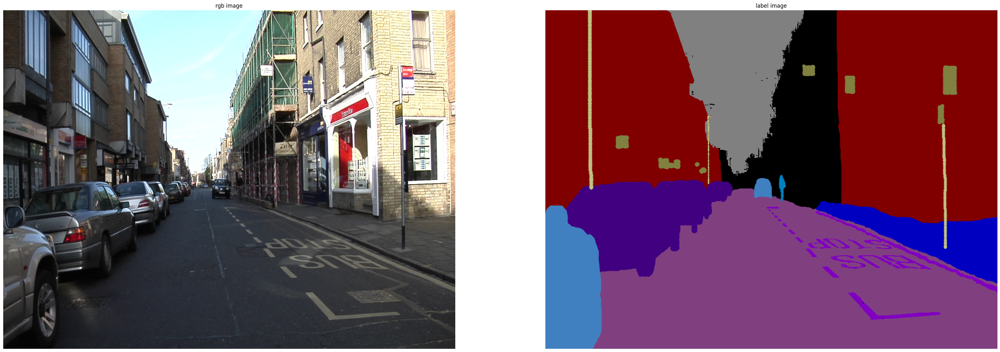

In [2]:
import random
number_of_samples = 5
for i in range(number_of_samples):
    random_idx = random.randint(0, len(dataset_info['train'][0])-1 )
    rgb_path = (dataset_info['train'][0][random_idx])
    label_apth = (dataset_info['train'][1][random_idx])

    plt.figure(figsize=(40, 80))
    rgb_img = plt.imread(rgb_path)
    label_img = plt.imread(label_apth) 

    plt.subplot(number_of_samples, 2, 2*(i+1)-1)
    plt.imshow(rgb_img)
    plt.title('rgb image')
    plt.axis('off')

    plt.subplot(number_of_samples, 2, 2*(i+1))
    plt.imshow(label_img)
    plt.title('label image')
    plt.axis('off')

plt.show()



# Q1: colors: 
camvid_data.py used

In [3]:
RGBLabel2LabelName = { # based on camvid_data.py
    (128, 128, 128): "Sky",

    (0, 128, 64): "Building",
    (128, 0, 0): "Building",
    (64, 192, 0): "Building",
    (64, 0, 64): "Building",
    (192, 0, 128): "Building",

    (192, 192, 128): "Pole",
    (0, 0, 64): "Pole",

    (128, 64, 128): "Road",
    (128, 0, 192): "Road",
    (192, 0, 64): "Road",

    (0, 0, 192): "Sidewalk",
    (64, 192, 128): "Sidewalk",
    (128, 128, 192): "Sidewalk",

    (128, 128, 0): "Tree",
    (192, 192, 0): "Tree",

    (192, 128, 128): "SignSymbol",
    (128, 128, 64): "SignSymbol",
    (0, 64, 64): "SignSymbol",

    (64, 64, 128): "Fence",

    (64, 0, 128): "Car",
    (64, 128, 192): "Car",
    (192, 128, 192): "Car",
    (192, 64, 128): "Car",
    (128, 64, 64): "Car",

    (64, 64, 0): "Pedestrian",
    (192, 128, 64): "Pedestrian",
    (64, 0, 192): "Pedestrian",
    (64, 128, 64): "Pedestrian",

    (0, 128, 192): "Bicyclist",
    (192, 0, 192): "Bicyclist",

    (0, 0, 0): "Void"
}

void_number = 255
RGB2CLASS  = {
    (128, 128, 128): 0,   # Sky
    (0, 128, 64): 1, (128, 0, 0): 1, (64, 192, 0): 1, (64, 0, 64): 1, (192, 0, 128): 1,  # Building
    (192, 192, 128): 2, (0, 0, 64): 2,  # Pole
    (128, 64, 128): 3, (128, 0, 192): 3, (192, 0, 64): 3,  # Road
    (0, 0, 192): 4, (64, 192, 128): 4, (128, 128, 192): 4,  # Sidewalk
    (128, 128, 0): 5, (192, 192, 0): 5,  # Tree
    (192, 128, 128): 6, (128, 128, 64): 6, (0, 64, 64): 6,  # SignSymbol
    (64, 64, 128): 7,  # Fence
    (64, 0, 128): 8, (64, 128, 192): 8, (192, 128, 192): 8, (192, 64, 128): 8, (128, 64, 64): 8,  # Car
    (64, 64, 0): 9, (192, 128, 64): 9, (64, 0, 192): 9, (64, 128, 64): 9,  # Pedestrian
    (0, 128, 192): 10, (192, 0, 192): 10,  # Bicyclist
    (0, 0, 0): void_number  # Void----> in the next parts void_number is considered void
}

# Q1: 4-1: model:

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F


# definning sub moduls for the network:
# depthwisee separables :
class DSConv(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super().__init__()
        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=stride,
                                   padding=1, groups=in_channels, bias=False)
        self.pointwise =nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)

        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.depthwise(x)
        x =self.pointwise(x)
        x =self.bn(x)
        return self.relu(x)

# def bottleneck parts:
class Bottleneck(nn.Module):
    def __init__(self, in_channels, out_channels, expansion, stride, repeat):
        super().__init__()
        layers = []
        hidden_dim = in_channels * expansion
        for i in range(repeat):
            s = stride if i == 0 else 1
            layers.extend([
                nn.Conv2d(in_channels if i == 0 else out_channels, hidden_dim, kernel_size=1, bias=False),
                nn.BatchNorm2d(hidden_dim),
                nn.ReLU(inplace=True),

                nn.Conv2d(hidden_dim, hidden_dim, kernel_size=3, stride=s, padding=1, groups=hidden_dim, bias=False),
                nn.BatchNorm2d(hidden_dim),
                nn.ReLU(inplace=True),

                nn.Conv2d(hidden_dim, out_channels, kernel_size=1, bias=False),
                nn.BatchNorm2d(out_channels),
            ])
        self.block = nn.Sequential(*layers)
        self.use_residual = (in_channels == out_channels and stride == 1)

    def forward(self, x):
        out = self.block(x)
        return x + out if self.use_residual else out


# pyramid pooling: 
class PPM(nn.Module):
    def __init__(self, in_channels, pool_sizes=(1, 2, 3, 6)):
        super().__init__()
        self.stages = nn.ModuleList([
            nn.Sequential(
                nn.AdaptiveAvgPool2d(output_size=s),

                nn.Conv2d(in_channels, in_channels, kernel_size=1, bias=False),

                nn.BatchNorm2d(in_channels),

                nn.ReLU(inplace=True)
            ) for s in pool_sizes
        ])

    def forward(self, x):
        h, w = x.shape[2:]
        ppm_out = [x] + [F.interpolate(stage(x), size=(h, w), mode='bilinear', align_corners=False) for stage in self.stages]
        return torch.cat(ppm_out, dim=1)


# feature dusion:
class FeatureFusion(nn.Module):
    def __init__(self, high_res_channels, low_res_channels, out_channels):
        super().__init__()
        self.dwconv = DSConv(low_res_channels, out_channels, stride=1)

        self.conv_low = nn.Conv2d(out_channels, out_channels, kernel_size=1, bias=False)

        self.conv_high = nn.Conv2d(high_res_channels, out_channels, kernel_size=1, bias=False)

        self.bn = nn.BatchNorm2d(out_channels)

        self.relu = nn.ReLU(inplace=True)

    def forward(self, high_res, low_res):
        low_res = F.interpolate(low_res, size=high_res.shape[2:], mode='bilinear', align_corners=False)
        low_res = self.conv_low(self.dwconv(low_res))
        high_res = self.conv_high(high_res)




        return self.relu(self.bn(high_res + low_res))



# the network:
class FastSCNN (nn.Module): 
    def __init__(self, num_classes):
        super().__init__()

        # 1: learning to downsample:
        self.dwonsampling = nn.Sequential(
            # 
            nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            DSConv(32,48,2),
            DSConv(48,64,2)
        )

        self.global_feature_extractor= nn.Sequential(
            Bottleneck(64,64,expansion=6,stride=2,repeat=3),
            
            Bottleneck(64,96,expansion=6,stride=2,repeat=3),

            Bottleneck(96,128,expansion=6,stride=2,repeat=3),
            PPM(128)
        )
        self.ppm_reduce = nn.Conv2d(128 * 5, 128, kernel_size=1, bias=False)  # Reduce 640 → 128
        # the above line adde to reduce from 640 to 128 for feature fusion
        
        # 3. Feature Fusion
        self.fusion = FeatureFusion(64, 128, 128) 

        self.classifer = nn.Sequential(
            DSConv(128,128,stride=1),
            DSConv(128,128,stride=1),
            nn.Dropout(0.1),
            nn.Conv2d(128, num_classes, kernel_size=1)
        )

    def forward (self, x):
        size = x.shape[2:]
        higher_res_features = self.dwonsampling(x)
        low_res_features = self.global_feature_extractor(higher_res_features)
        low_res_features = self.ppm_reduce(low_res_features)
        fused = self.fusion(higher_res_features, low_res_features)
        out = self.classifer(fused)
        return F.interpolate(out, size=size, mode='bilinear', align_corners=False)
    

# defining datase:

In [5]:
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import numpy as np


class myDataset (Dataset):
    def __init__(self, rgb_paths, label_paths, transform):
        self.rgb_paths = rgb_paths
        self.label_paths = label_paths
        self.transform = transform

    def __len__ (self):
        return len(self.label_paths)
    
    def __getitem__(self, idx):
        rgb = Image.open(self.rgb_paths[idx]).convert("RGB")
        label = Image.open(self.label_paths[idx]).convert("RGB")

        rgb = self.transform(rgb)
        label = np.array(label)
        class_map = np.zeros(label.shape[:2], dtype=np.uint8) + void_number 
        
        for k, v in RGB2CLASS.items():
            mask = np.all(label == k, axis=-1)
            class_map[mask] = v # match to classes labels
        class_map = torch.from_numpy(class_map).long()
        return rgb, class_map


# define dataloader


In [6]:
# run stting:
NUM_CLASSES = 11  # excluding void
BATCH_SIZE = 14
BASE_LR = 0.045
POWER = 0.9
WEIGHT_DECAY = 0.00004
num_epochs = 100

from torch.utils.data import DataLoader
transform = transforms.Compose([
    # transforms.Resize((720, 960)), 
    transforms.ToTensor(),
])

train_dataset = myDataset(dataset_info['train'][0],dataset_info['train'][1],transform)
val_dataset = myDataset(dataset_info['val'][0], dataset_info['val'][1],transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=2)


# def metrics:

In [7]:
# def dice_coef(pred, target, smooth=1. , void_number = void_number ):
#     pred = torch.softmax(pred, dim=1) # to convert ro classes probilities
#     pred = torch.argmax(pred, dim=1) 

#     pred_flat = pred.contiguous().view(-1)
#     target_flat = target.contiguous().view(-1)

#     mask = target_flat != void_number # to remove void and ignored areas
#     pred_flat = pred_flat[mask]
#     target_flat = target_flat[mask]

#     intersection = (pred_flat == target_flat).float().sum()
#     return (2. * intersection + smooth) / (pred_flat.numel() + target_flat.numel() + smooth)

# def iou_score(pred, target, num_classes=NUM_CLASSES):
#     pred = torch.argmax(torch.softmax(pred, dim=1), dim=1)
#     iou = 0
#     for cls in range(num_classes):
#         pred_inds = (pred == cls)
#         target_inds = (target == cls)
#         if target_inds.sum() == 0:
#             continue
#         intersection = (pred_inds & target_inds).sum().item()
#         union = (pred_inds | target_inds).sum().item()
#         iou += intersection / (union + 1e-6)
#     return iou / num_classes

def iou_score(pred, target, num_classes=NUM_CLASSES, void_number=None):
    pred = torch.argmax(torch.softmax(pred, dim=1), dim=1)# cinvert to class labels

    iou_total = 0.0
    valid_classes = 0

    for cls in range(num_classes):
        pred_inds = (pred == cls)
        target_inds = (target == cls)

        if void_number is not None:# remove void data to not allowing it to be considered as the valid value and increase the metrics
            void_mask = (target != void_number)
            pred_inds = pred_inds & void_mask
            target_inds = target_inds & void_mask

        intersection = (pred_inds & target_inds).sum().item()
        union = (pred_inds | target_inds).sum().item()

        if union > 0:
            iou_total += intersection / (union)
            valid_classes += 1

    return iou_total / valid_classes if valid_classes > 0 else 0.0


def dice_coef(pred, target, num_classes=NUM_CLASSES, smooth=0.0001,void_number=void_number):
    pred = torch.argmax(torch.softmax(pred, dim=1), dim=1) # cinvert to class labels
    dice_total = 0.0
    valid_classes = 0

    for cls in range(num_classes):
        pred_inds = (pred == cls)
        target_inds = (target == cls)

        if void_number is not None: # remove void data to not allowing it to be considered as the valid value and increase the metrics
            void_mask = (target != void_number)
            pred_inds = pred_inds & void_mask
            target_inds = target_inds & void_mask

        intersection = (pred_inds & target_inds).sum().item()
        pred_sum = pred_inds.sum().item()
        target_sum = target_inds.sum().item()

        if target_sum + pred_sum > 0:
            dice = (2. * intersection + smooth) / (pred_sum + target_sum + smooth)
            dice_total += dice
            valid_classes += 1

    return dice_total / valid_classes if valid_classes > 0 else 0.0

Model properties:

In [8]:
from torchsummary import summary
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(device)
# model = FastSCNN(num_classes=NUM_CLASSES)
# model.to(device)
# criterion = nn.CrossEntropyLoss(ignore_index=void_number)
# summary(model, (3, 224, 224))

In [9]:
import torch.optim as optim


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

model = FastSCNN(num_classes=NUM_CLASSES)
model.to(device)

criterion = nn.CrossEntropyLoss(ignore_index=void_number)
summary(model, (3, 224, 224))

params = []
for name, param in model.named_parameters():
    if 'depthwise' in name:
        params.append({'params': param, 'weight_decay': 0.0}) # as mentioned in the paper this part of network doenst have l2
    else:
        params.append({'params': param, 'weight_decay': WEIGHT_DECAY})

optimizer = optim.SGD(params, lr=BASE_LR, momentum=0.9)

# for the learning rate in the paper:
def poly_lr_scheduler(optimizer, init_lr, iter, max_iter, power):
    new_lr = init_lr * (1 - iter / max_iter) ** power
    for param_group in optimizer.param_groups:
        param_group['lr'] = new_lr

cuda
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             864
       BatchNorm2d-2         [-1, 32, 112, 112]              64
              ReLU-3         [-1, 32, 112, 112]               0
            Conv2d-4           [-1, 32, 56, 56]             288
            Conv2d-5           [-1, 48, 56, 56]           1,536
       BatchNorm2d-6           [-1, 48, 56, 56]              96
              ReLU-7           [-1, 48, 56, 56]               0
            DSConv-8           [-1, 48, 56, 56]               0
            Conv2d-9           [-1, 48, 28, 28]             432
           Conv2d-10           [-1, 64, 28, 28]           3,072
      BatchNorm2d-11           [-1, 64, 28, 28]             128
             ReLU-12           [-1, 64, 28, 28]               0
           DSConv-13           [-1, 64, 28, 28]               0
           Conv2d-14          [-1,

In [10]:
total_params = sum(p.numel() for p in model.parameters())
print(f"number of parameters: {total_params}")

number of parameters: 1069019


In [11]:
import time
save_history ={
    "train_loss": [],
    "val_loss": [],
    "train_acc": [],
    "val_acc": [],
    "train_dice": [],
    "val_dice": [],
    "train_iou": [],
    "val_iou": []
}

from torch.nn.functional import softmax

def pixel_accuracy(pred, target):
    pred = torch.argmax(softmax(pred, dim=1), dim=1)
    mask = (target != void_number)
    correct = (pred == target) & mask
    return correct.sum().float() / mask.sum().float()

for epoch in range(num_epochs):
    t = time.time()
    model.train()
    train_loss, train_dice, train_iou, train_acc = 0, 0, 0, 0
    for i, (imgs, labels) in enumerate(train_loader):
        imgs = imgs.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        poly_lr_scheduler(optimizer, BASE_LR, epoch * len(train_loader) + i, num_epochs * len(train_loader), POWER)

        train_loss += loss.item()
        train_dice += dice_coef(outputs, labels)
        train_iou += iou_score(outputs, labels)
        train_acc += pixel_accuracy(outputs, labels).item()

    save_history['train_loss'].append(train_loss / len(train_loader))
    save_history['train_dice'].append(train_dice / len(train_loader))
    save_history['train_iou'].append(train_iou / len(train_loader))
    save_history['train_acc'].append(train_acc / len(train_loader))

    # validation:
    model.eval()
    val_loss, val_dice, val_iou, val_acc = 0, 0, 0, 0
    with torch.no_grad():
        for imgs, labels in val_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            val_dice += dice_coef(outputs, labels)
            val_iou += iou_score(outputs, labels)
            val_acc += pixel_accuracy(outputs, labels).item()

    save_history['val_loss'].append(val_loss / len(val_loader))
    save_history['val_dice'].append(val_dice / len(val_loader))
    save_history['val_iou'].append(val_iou / len(val_loader))
    save_history['val_acc'].append(val_acc / len(val_loader))

    print(f"  Epoch [{epoch+1}] Loss: {train_loss/len(train_loader):.2f} epoch time= {time.time()-t:.2f}s | Dice: {train_dice/len(train_loader):.2f} | IoU: {train_iou/len(train_loader):.2f}. || Accuracy : {train_acc/len(train_loader):.2f}")
    print(f"  ------------------------->> validation : | Dice: {val_dice/len(val_loader):.2f} | IoU: {val_iou/len(val_loader):.2f}. || Accuracy : {val_acc/len(val_loader):.2f}")

    if val_dice/len(val_loader) > 0.55 and val_iou/len(val_loader) > 0.55 and epoch > 40: # to satisfy the mentioned conditions in the homework
        print("conditions satisfied")
        break



  Epoch [1] Loss: 1.19 epoch time= 64.83s | Dice: 0.22 | IoU: 0.17. || Accuracy : 0.63
  ------------------------->> validation : | Dice: 0.16 | IoU: 0.11. || Accuracy : 0.48
  Epoch [2] Loss: 0.74 epoch time= 64.53s | Dice: 0.32 | IoU: 0.26. || Accuracy : 0.75
  ------------------------->> validation : | Dice: 0.26 | IoU: 0.21. || Accuracy : 0.63
  Epoch [3] Loss: 0.63 epoch time= 66.04s | Dice: 0.38 | IoU: 0.31. || Accuracy : 0.79
  ------------------------->> validation : | Dice: 0.36 | IoU: 0.29. || Accuracy : 0.72
  Epoch [4] Loss: 0.56 epoch time= 64.08s | Dice: 0.41 | IoU: 0.34. || Accuracy : 0.82
  ------------------------->> validation : | Dice: 0.37 | IoU: 0.31. || Accuracy : 0.73
  Epoch [5] Loss: 0.54 epoch time= 65.35s | Dice: 0.42 | IoU: 0.34. || Accuracy : 0.83
  ------------------------->> validation : | Dice: 0.38 | IoU: 0.32. || Accuracy : 0.74
  Epoch [6] Loss: 0.50 epoch time= 66.88s | Dice: 0.43 | IoU: 0.36. || Accuracy : 0.84
  ------------------------->> validati

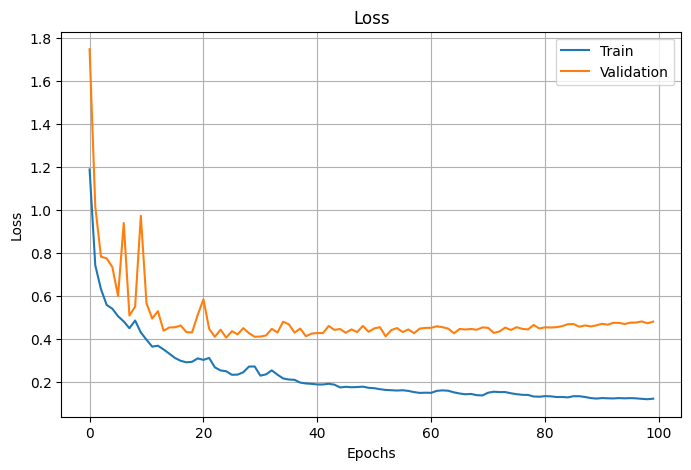

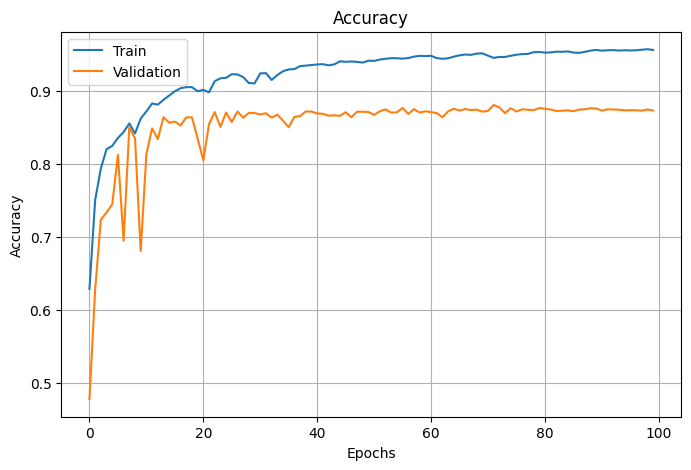

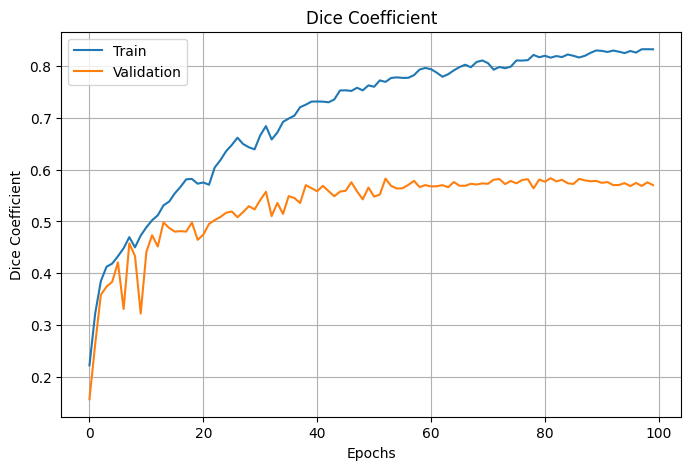

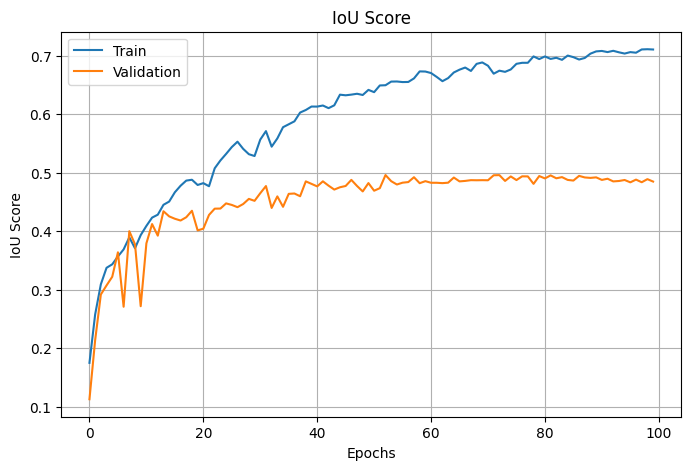

In [12]:
import matplotlib.pyplot as plt

def plot_metric(history, metric, ylabel):
    plt.figure(figsize=(8, 5))
    plt.plot(history[f"train_{metric}"], label='Train')
    plt.plot(history[f"val_{metric}"], label='Validation')
    plt.xlabel("Epochs")
    plt.ylabel(ylabel)
    plt.title(f"{ylabel}")
    plt.legend()
    plt.grid(True)
    plt.show()

plot_metric(save_history, "loss", "Loss")
plot_metric(save_history, "acc", "Accuracy")
plot_metric(save_history, "dice", "Dice Coefficient")
plot_metric(save_history, "iou", "IoU Score")


In [13]:
CLASS2RGB = {
    0: (128, 128, 128),  # Sky
    1: (0, 128, 64),     # Building (arbitrary 1 of the many RGBs)
    2: (192, 192, 128),  # Pole
    3: (128, 64, 128),   # Road
    4: (0, 0, 192),      # Sidewalk
    5: (128, 128, 0),    # Tree
    6: (192, 128, 128),  # SignSymbol
    7: (64, 64, 128),    # Fence
    8: (64, 0, 128),     # Car
    9: (64, 64, 0),      # Pedestrian
    10: (0, 128, 192),   # Bicyclist
}
def decode_segmentation(mask): # to convert from classes to rgb
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for cls_id, color in CLASS2RGB.items():
        color_mask[mask == cls_id] = color
    return color_mask

# Show some samples

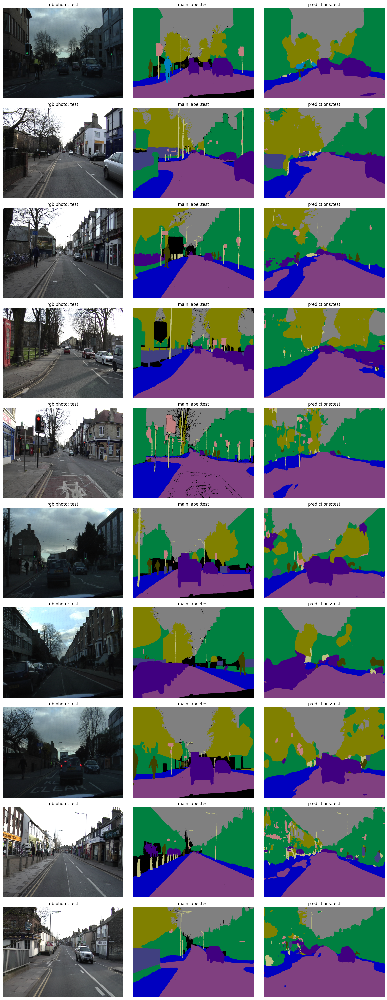

In [16]:
import matplotlib.pyplot as plt
import random
import numpy as np
from PIL import Image
import torch
num_samples= 10
model.eval()
idxs = random.sample(range(len(dataset_info['test'][0])), num_samples)
transform = transforms.Compose([
    # transforms.Resize((360, 480)),
    transforms.ToTensor()
])

plt.figure(figsize=(16, num_samples * 4))
for i , idx in enumerate(idxs):
    rgb_path = dataset_info['test'][0][idx]
    label_path = dataset_info['test'][1][idx]  

    rgb = Image.open(rgb_path).convert("RGB")
    label = Image.open(label_path).convert("RGB")
    rgb_tensor = transform(rgb).unsqueeze(0).to(device)
    with torch.no_grad():
        pred = model(rgb_tensor)
        pred_class = torch.argmax(pred, dim=1).squeeze().cpu().numpy()

    label_np = np.array(label)
    class_map = np.zeros(label_np.shape[:2], dtype=np.uint8) + void_number
    for k, v in RGB2CLASS.items():
        mask = np.all(label_np == k, axis=-1)
        class_map[mask] = v

    label_rgb = decode_segmentation(class_map)
    pred_rgb = decode_segmentation(pred_class)  
    
    plt.subplot(num_samples, 3, 3 * i + 1)
    plt.imshow(rgb)
    plt.title("rgb photo: test")
    plt.axis('off')

    plt.subplot(num_samples, 3, 3 * i + 2)
    plt.imshow(label_rgb)
    plt.title("main label:test")
    plt.axis('off')

    plt.subplot(num_samples, 3, 3 * i + 3)
    plt.imshow(pred_rgb)
    plt.title("predictions:test")
    plt.axis('off')

plt.tight_layout()
plt.show()

